# Olivier's MinifigNET notebook

## 1. Importing Libraries

In [229]:
import os
from PIL import Image
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dropout, Dense
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping

## 2. Loading Dataset


In [202]:
os.listdir('../raw_data/')
data_path = '../raw_data/'

train_index_df = pd.read_csv(os.path.join(data_path, 'index.csv'))
train_index_df.class_id = train_index_df.class_id - 1
train_index_df


,path,class_id
0,marvel/0001/001.jpg,0
1,marvel/0001/002.jpg,0
2,marvel/0001/003.jpg,0
3,marvel/0001/004.jpg,0
4,marvel/0001/005.jpg,0
...,...,...
366,star-wars/0017/006.jpg,37
367,star-wars/0017/007.jpg,37
368,star-wars/0017/008.jpg,37
369,star-wars/0017/009.jpg,37


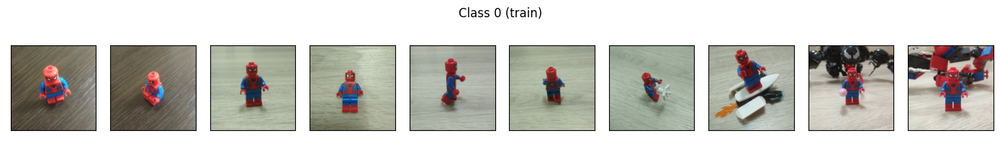

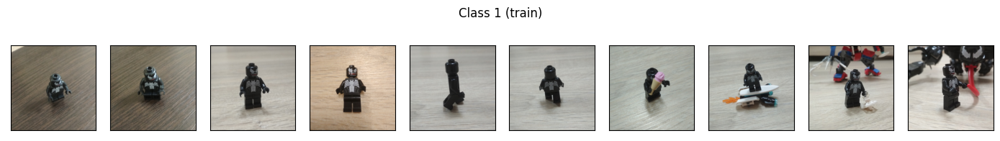

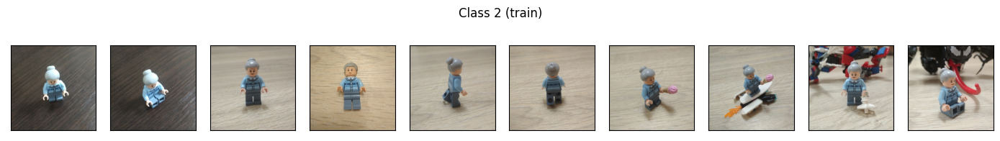

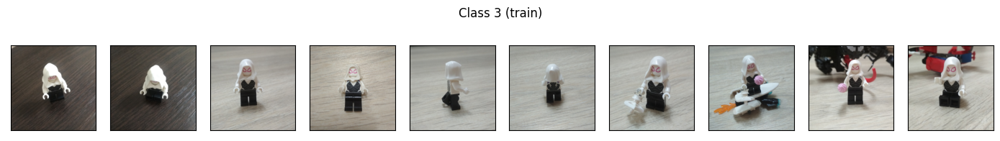

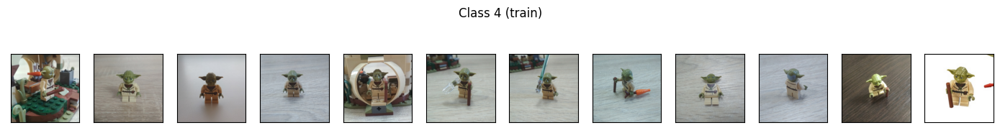

...

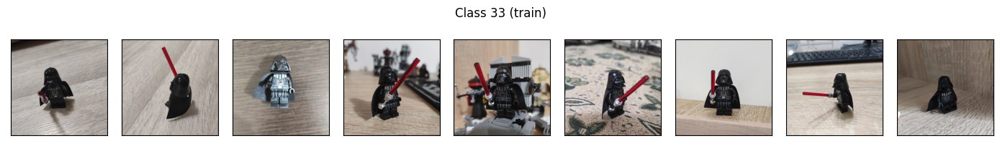

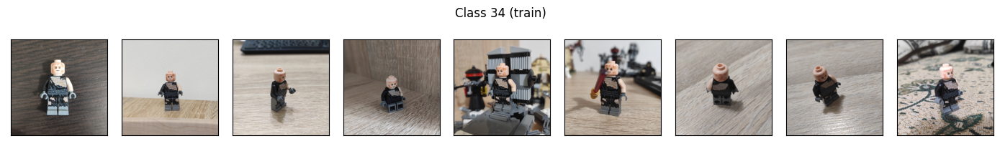

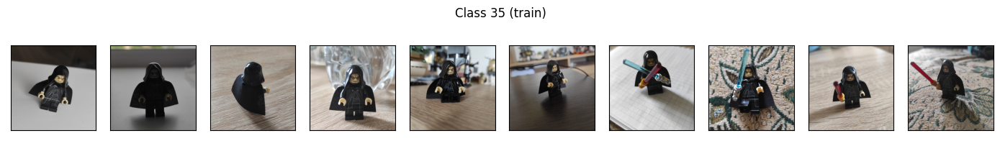

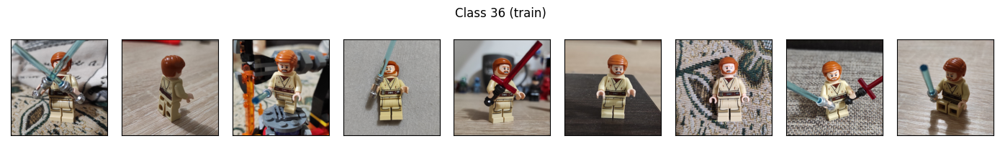

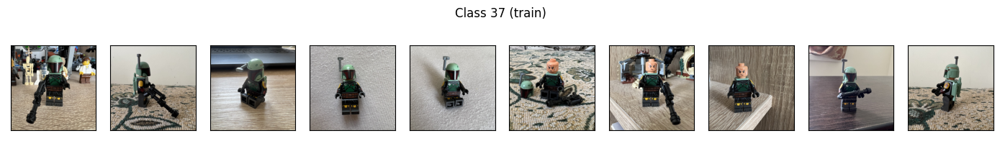

In [203]:
class_groups = train_index_df.groupby("class_id")
for id, group in class_groups:

    plt.figure(figsize=(14, 2))
    plt.suptitle(f"Class {id} (train)")

    group_length = len(group)
    for i in range(group_length):
        plt.subplot(1, group_length, i + 1)
        image = np.array(Image.open(
            os.path.join(data_path, group.iloc[i, 0])
            ).resize(
                (512, 512))
            ) / 255.0

        plt.imshow(image)

        plt.xticks([], [])
        plt.yticks([], [])
    plt.tight_layout()
    plt.show()

In [204]:
test_index_df = pd.read_csv(os.path.join(data_path, 'test.csv'))
test_index_df.class_id = test_index_df.class_id - 1
test_index_df

,path,class_id
0,test/001.jpg,31
1,test/002.jpg,31
2,test/003.jpg,31
3,test/004.jpg,31
4,test/005.jpg,0
...,...,...
74,test/075.jpg,36
75,test/076.jpg,36
76,test/077.jpg,37
77,test/078.jpg,37


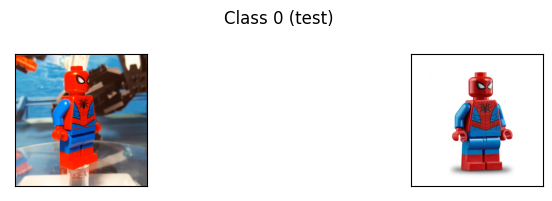

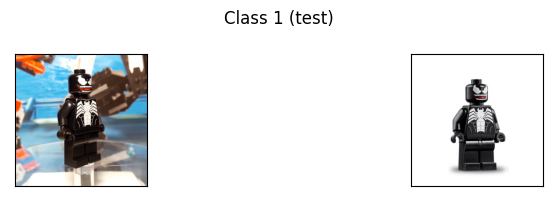

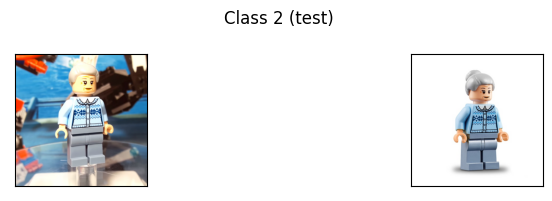

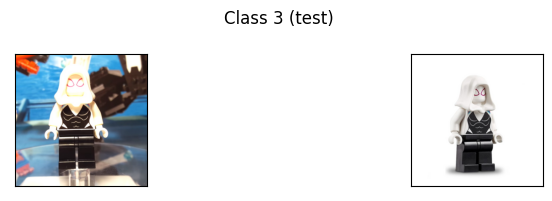

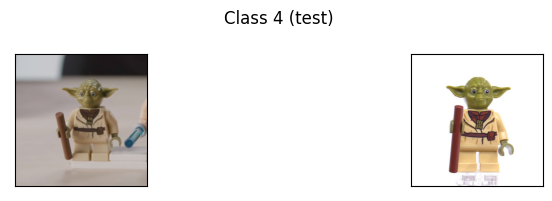

...

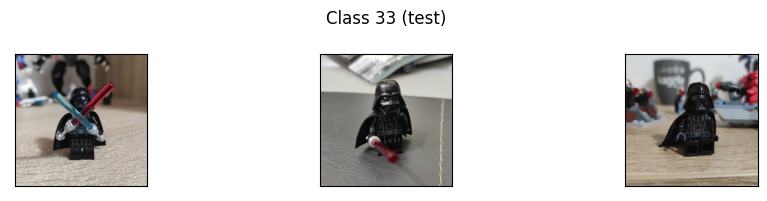

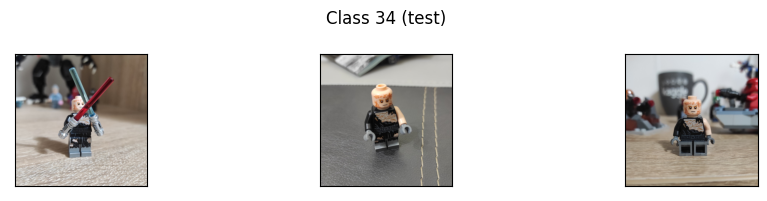

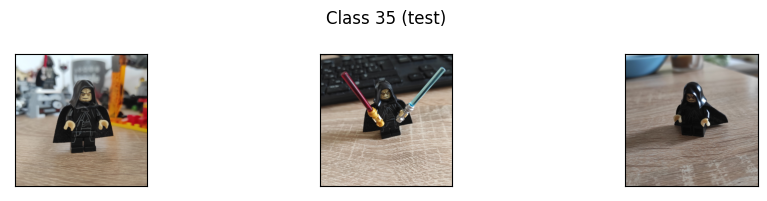

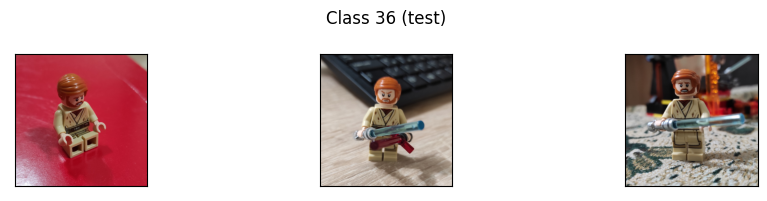

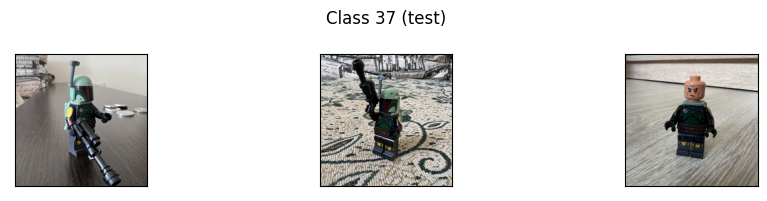

In [205]:
class_groups = test_index_df.groupby("class_id")
for id, group in class_groups:

    plt.figure(figsize=(10, 2))
    plt.suptitle(f"Class {id} (test)")

    group_length = len(group)
    for i in range(group_length):
        plt.subplot(1, group_length, i + 1)
        image = np.array(Image.open(
            os.path.join(data_path, group.iloc[i, 0])
        ).resize(
                (512, 512))
        ) / 255.0

        plt.imshow(image)

        plt.xticks([], [])
        plt.yticks([], [])
    plt.tight_layout()
    plt.show()

In [206]:
meta_df = pd.read_csv(os.path.join(data_path, 'metadata.csv'))
meta_df.class_id = meta_df.class_id - 1
meta_df

,class_id,lego_ids,lego_names,minifigure_name
0,0,[76115],['Spider Mech vs. Venom'],SPIDER-MAN
1,1,[76115],['Spider Mech vs. Venom'],VENOM
2,2,[76115],['Spider Mech vs. Venom'],AUNT MAY
3,3,[76115],['Spider Mech vs. Venom'],GHOST SPIDER
4,4,[75208],"[""Yoda's Hut""]",YODA
5,5,[75208],"[""Yoda's Hut""]",LUKE SKYWALKER
6,6,[75208],"[""Yoda's Hut""]",R2-D2
7,7,[75199],"[""General Grievous' Combat Speeder""]",MACE WINDU
8,8,[75199],"[""General Grievous' Combat Speeder""]",GENERAL GRIEVOUS
9,9,[75264],"[""Kylo Ren's Shuttle Microfighter""]",KYLO REN


In [207]:
train_df = pd.merge(
    train_index_df, meta_df, on='class_id')
train_df.head(20)


,path,class_id,lego_ids,lego_names,minifigure_name
0,marvel/0001/001.jpg,0,[76115],['Spider Mech vs. Venom'],SPIDER-MAN
1,marvel/0001/002.jpg,0,[76115],['Spider Mech vs. Venom'],SPIDER-MAN
2,marvel/0001/003.jpg,0,[76115],['Spider Mech vs. Venom'],SPIDER-MAN
3,marvel/0001/004.jpg,0,[76115],['Spider Mech vs. Venom'],SPIDER-MAN
4,marvel/0001/005.jpg,0,[76115],['Spider Mech vs. Venom'],SPIDER-MAN
5,marvel/0001/006.jpg,0,[76115],['Spider Mech vs. Venom'],SPIDER-MAN
6,marvel/0001/007.jpg,0,[76115],['Spider Mech vs. Venom'],SPIDER-MAN
7,marvel/0001/008.jpg,0,[76115],['Spider Mech vs. Venom'],SPIDER-MAN
8,marvel/0001/009.jpg,0,[76115],['Spider Mech vs. Venom'],SPIDER-MAN
9,marvel/0001/010.jpg,0,[76115],['Spider Mech vs. Venom'],SPIDER-MAN


In [191]:
test_df = pd.merge(
    test_index_df, meta_df, on='class_id')
test_df

,path,class_id,lego_ids,lego_names,minifigure_name
0,test/001.jpg,32,[75273],"[""Poe Dameron's X-wing Fighter""]",JANNAH
1,test/002.jpg,32,[75273],"[""Poe Dameron's X-wing Fighter""]",JANNAH
2,test/003.jpg,32,[75273],"[""Poe Dameron's X-wing Fighter""]",JANNAH
3,test/004.jpg,32,[75273],"[""Poe Dameron's X-wing Fighter""]",JANNAH
4,test/005.jpg,1,[76115],['Spider Mech vs. Venom'],SPIDER-MAN
...,...,...,...,...,...
74,test/075.jpg,37,[75269],"[""Duel on Mustafar""]",OBI-WAN KENOBI
75,test/076.jpg,37,[75269],"[""Duel on Mustafar""]",OBI-WAN KENOBI
76,test/077.jpg,38,[75312],"[""Boba Fett's Starship""]",BOBA FETT
77,test/078.jpg,38,[75312],"[""Boba Fett's Starship""]",BOBA FETT


## 3. Exploratory Data Analysis


In [208]:
print("Missing Data:")
train_df.isnull().sum()

Missing Data:


path               0
class_id           0
lego_ids           0
lego_names         0
minifigure_name    0
dtype: int64

Text(0.5, 1.0, 'Nb of training samples by class histogram')

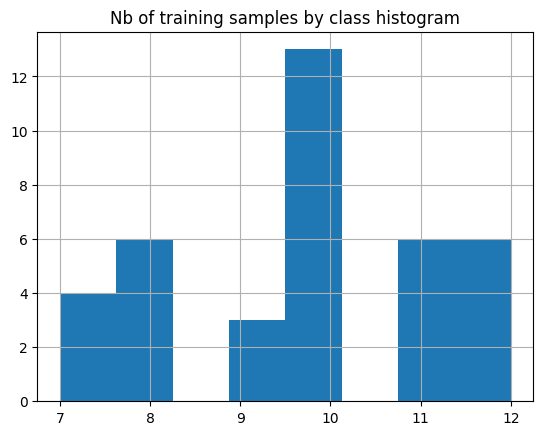

In [209]:
train_index_df.groupby(by='class_id')['path'].count().hist(bins=8)
plt.title("Nb of training samples by class histogram")

In [210]:
NAME_AND_CLASS = "name_and_class"
train_df[NAME_AND_CLASS] = "#" + train_df["class_id"].apply(lambda i: f"{i:02d} ") + train_df["minifigure_name"]
labels = train_df[NAME_AND_CLASS].unique()
count = train_df[NAME_AND_CLASS].value_counts().sort_index()
count

#00 SPIDER-MAN                     10
#01 VENOM                          10
#02 AUNT MAY                       10
#03 GHOST SPIDER                   10
#04 YODA                           12
#05 LUKE SKYWALKER                 12
#06 R2-D2                          12
#07 MACE WINDU                     11
#08 GENERAL GRIEVOUS               12
#09 KYLO REN                        8
#10 THE MANDALORIAN                 7
#11 CARA DUNE                       7
#12 KLATOOINIAN RAIDER 1            7
#13 KLATOOINIAN RAIDER 2            7
#14 MYSTERIO                        8
#15 FIREFIGHTER                     8
#16 SPIDER-MAN                      8
#17 HARRY POTTER                   11
#18 RON WEASLEY                    11
#19 BLACK WIDOW                    11
#20 YELENA BELOVA                  11
#21 TASKMASTER                     11
#22 CAPTAIN AMERICA                10
#23 OUTRIDER 1                     10
#24 OUTRIDER 2                     10
#25 OWEN GRADY                     12
#26 TRACKER 

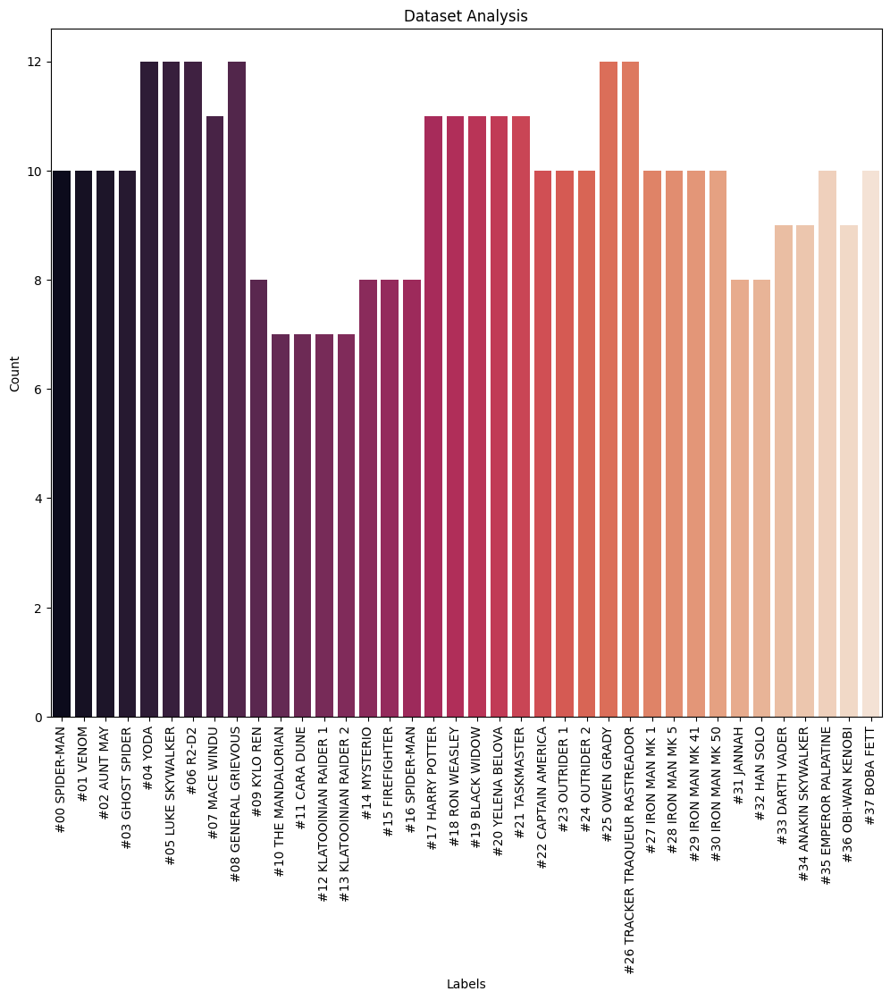

In [211]:
# Visualizing quantity of each minifugure in dataset
plt.figure(figsize=(12, 10))
sns.barplot(x=count.index, y=count, palette="rocket")

plt.xticks(rotation=90)
plt.xlabel('Labels')
plt.ylabel('Count')
plt.title('Dataset Analysis')
plt.show()

In [221]:
# Evaluating total number of classes
CLASSES = len(train_df['class_id'].unique())
CLASSES

38

## 4. Data Preprocessing

In [217]:
# Training Data Preprocessing
image_size = (224, 224)

X_train = np.zeros((train_df.shape[0], *image_size, 3))

for i in range(train_df.shape[0]):
    X_train[i] = np.array(
        Image.open(
            os.path.join(data_path, train_df["path"].values[i])
        ).resize(image_size)
    ) / 255.0
X_train = tf.constant(X_train)
X_train

<tf.Tensor: shape=(371, 224, 224, 3), dtype=float64, numpy=
array([[[[0.37647059, 0.34509804, 0.27843137],
         [0.38431373, 0.34901961, 0.28235294],
         [0.38823529, 0.35294118, 0.28627451],
         ...,
         [0.56078431, 0.54901961, 0.48235294],
         [0.56470588, 0.55294118, 0.48627451],
         [0.56078431, 0.54901961, 0.48235294]],

        [[0.4       , 0.37254902, 0.30196078],
         [0.41176471, 0.38039216, 0.30980392],
         [0.41176471, 0.37647059, 0.30980392],
         ...,
         [0.56470588, 0.55294118, 0.48627451],
         [0.57254902, 0.56078431, 0.49411765],
         [0.56862745, 0.55686275, 0.49019608]],

        [[0.41568627, 0.38823529, 0.31764706],
         [0.41176471, 0.38431373, 0.31372549],
         [0.40784314, 0.37647059, 0.30980392],
         ...,
         [0.56862745, 0.55686275, 0.49019608],
         [0.58039216, 0.56862745, 0.50196078],
         [0.56862745, 0.55686275, 0.49019608]],

        ...,

        [[0.31764706, 0.27843137

In [213]:
y_train = tf.constant(train_df["class_id"])
y_train

<tf.Tensor: shape=(371,), dtype=int64, numpy=
array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  3,  3,  3,  3,
        3,  3,  3,  3,  3,  3,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,
        4,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  6,  6,  6,  6,
        6,  6,  6,  6,  6,  6,  6,  6,  7,  7,  7,  7,  7,  7,  7,  7,  7,
        7,  7,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  9,  9,  9,
        9,  9,  9,  9,  9, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11,
       11, 11, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 14,
       14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16,
       16, 16, 16, 16, 16, 16, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17,
       18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 19, 19, 19, 19, 19, 19,
       19, 19, 19, 19, 19, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 21,
       21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 22, 22,

In [219]:
# Test Data Preprocessing
X_test = np.zeros((test_df.shape[0], *image_size, 3))

for i in range(test_df.shape[0]):
    X_test[i] = np.array(
        Image.open(
            os.path.join(data_path, test_df["path"].values[i])
        ).resize(image_size)
    ) / 255.0
X_test = tf.constant(X_test)
X_test

<tf.Tensor: shape=(79, 224, 224, 3), dtype=float64, numpy=
array([[[[0.77254902, 0.74117647, 0.83137255],
         [0.77254902, 0.74117647, 0.83137255],
         [0.77254902, 0.74117647, 0.82352941],
         ...,
         [0.67843137, 0.64705882, 0.72941176],
         [0.67843137, 0.64705882, 0.72941176],
         [0.67843137, 0.64705882, 0.72941176]],

        [[0.77647059, 0.74509804, 0.83529412],
         [0.77647059, 0.74509804, 0.83529412],
         [0.77647059, 0.74509804, 0.82745098],
         ...,
         [0.68235294, 0.65098039, 0.73333333],
         [0.68235294, 0.65098039, 0.73333333],
         [0.68235294, 0.65098039, 0.73333333]],

        [[0.77647059, 0.74509804, 0.83529412],
         [0.77647059, 0.74509804, 0.83529412],
         [0.77647059, 0.74509804, 0.82745098],
         ...,
         [0.68627451, 0.65490196, 0.7372549 ],
         [0.68627451, 0.65490196, 0.7372549 ],
         [0.68627451, 0.65490196, 0.7372549 ]],

        ...,

        [[0.1372549 , 0.12156863,

In [201]:
y_test = tf.constant(test_df["class_id"])
y_test

<tf.Tensor: shape=(79,), dtype=int64, numpy=
array([31, 31, 31, 31,  0,  0,  2,  2,  1,  1,  3,  3,  4,  4,  5,  5,  6,
        6, 17, 17, 18, 18, 25, 25, 26, 26, 14, 15, 16, 13, 19, 19, 19, 20,
       20, 20, 21, 21, 21, 22, 22, 23, 23, 24, 24, 27, 27, 28, 28, 29, 29,
       30, 30,  7,  7,  8,  8,  9,  9, 10, 11, 12, 32, 32, 33, 33, 33, 34,
       34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37])>

## 5. Loading Base Model for Transfer Learning

In [224]:
# Loading Base Model
base_model = MobileNetV2()

# Adding Dropout layer
x = Dropout(0.5)(base_model.layers[-2].output)

# Adding Dense layer
outputs = Dense(CLASSES, activation='softmax')(x)

# Creating model
model = Model(base_model.inputs, outputs)

# Displaying model summary
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

In [226]:
# Compiling model
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

## 6. Training Model

In [231]:
es = EarlyStopping(monitor='val_loss',
                    patience=10,
                    restore_best_weights=True)
history = model.fit(
    X_train, y_train,
    epochs=100,
    validation_data=(X_test, y_test),
    shuffle=True,
    batch_size=4,
    callbacks=es
)

Epoch 1/100


2023-12-12 20:58:08.132485: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-12-12 20:58:10.157132: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


93/93 [==============================] - ETA: 0s - loss: 3.7194 - accuracy: 0.0674

2023-12-12 20:58:25.994804: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


93/93 [==============================] - 19s 122ms/step - loss: 3.7194 - accuracy: 0.0674 - val_loss: 3.4013 - val_accuracy: 0.0886
Epoch 2/100
93/93 [==============================] - 8s 83ms/step - loss: 2.5282 - accuracy: 0.3720 - val_loss: 2.7275 - val_accuracy: 0.2532
Epoch 3/100
93/93 [==============================] - 8s 82ms/step - loss: 1.4856 - accuracy: 0.7358 - val_loss: 2.0660 - val_accuracy: 0.3924
Epoch 4/100
93/93 [==============================] - 8s 81ms/step - loss: 0.8994 - accuracy: 0.8571 - val_loss: 1.6873 - val_accuracy: 0.5063
Epoch 5/100
93/93 [==============================] - 8s 83ms/step - loss: 0.5430 - accuracy: 0.9515 - val_loss: 1.2338 - val_accuracy: 0.6456
Epoch 6/100
93/93 [==============================] - 8s 84ms/step - loss: 0.3197 - accuracy: 0.9704 - val_loss: 0.9425 - val_accuracy: 0.7722
Epoch 7/100
93/93 [==============================] - 8s 83ms/step - loss: 0.2404 - accuracy: 0.9730 - val_loss: 0.8788 - val_accuracy: 0.7722
Epoch 8/100
93/9

In [232]:
def plot_history(history, axs=None, exp_name=""):
    if axs is not None:
        ax1, ax2 = axs
    else:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    if len(exp_name) > 0 and exp_name[0] != '_':
        exp_name = '_' + exp_name
    ax1.plot(history.history['loss'], label='train' + exp_name)
    ax1.plot(history.history['val_loss'], label='val' + exp_name)
    # ax1.set_ylim(0., 2.2)
    ax1.set_title('loss')
    ax1.legend()

    ax2.plot(history.history['accuracy'], label='train accuracy' + exp_name)
    ax2.plot(history.history['val_accuracy'], label='val accuracy' + exp_name)
    # ax2.set_ylim(0.25, 1.)
    ax2.set_title('Accuracy')
    ax2.legend()
    return (ax1, ax2)

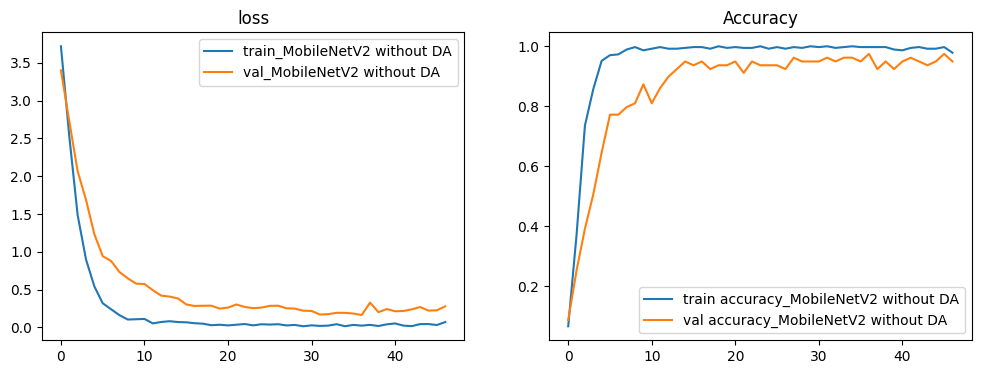

In [238]:
plot_history(history, exp_name="MobileNetV2 without DA");

In [239]:
model.evaluate(X_test, y_test);

3/3 [==============================] - 1s 119ms/step - loss: 0.1640 - accuracy: 0.9747
